### Exploring the data

In [122]:
# Import libraries 

from pyspark.sql import SparkSession, functions as F
from pyspark.sql.functions import isnan, when, count, col
import pandas as pd
import geopandas as gpd
import folium
from chart_studio import plotly as py
import plotly.graph_objs as go
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

In [123]:
# Create a spark session (which will run spark jobs)
spark = (
    SparkSession.builder.appName("MAST30034 Project 1")
    .config("spark.sql.repl.eagerEval.enabled", True) 
    .config("spark.sql.parquet.cacheMetadata", "true")
    .config("spark.sql.session.timeZon", "Etc/UTC")
    .config("spark.driver.memory", "4g")
    .config("spark.executor.memory", "8g")
    .getOrCreate()
)

### Data aggregation for visualization

In [124]:
# Load the final training data

train_data = spark.read.parquet("../data/curated/final_train_dataset.parquet/")

In [ ]:
# Select only the requires features

train_data.createOrReplaceTempView("train")

train_data = spark.sql(""" 

SELECT Year, Month, Date, Day, pickup_hour, trip_distance, PULocationID, 
DOLocationID, Borough, covid_cases, total_tests, positivity_rate, 
vehicle_and_ride_type
FROM train

""")

In [127]:
# Aggregate the two types of taxi trips by month

train_data.createOrReplaceTempView("uber_view")

uber = spark.sql(""" 

SELECT Month, COUNT(PULocationID) AS no_of_trips
FROM uber_view
WHERE vehicle_and_ride_type = 'Uber-Standard'
GROUP BY Month

""")

train_data.createOrReplaceTempView("yellow_view")

yellow = spark.sql(""" 

SELECT Month, COUNT(PULocationID) AS no_of_trips
FROM yellow_view
WHERE vehicle_and_ride_type = 'Yellow-Standard'
GROUP BY Month

""")

In [128]:
# Load the curated covid dataset for training data

covid = spark.read.parquet("../data/curated/covid_curated_train.parquet/")

In [129]:
# Aggregate the covid data by month

covid.createOrReplaceTempView("covid_view")

covid_agg = spark.sql(""" 

SELECT Month_dup AS month, SUM(covid_cases) AS tot_cases, 
AVG(positivity_rate) AS test_rate
FROM covid_view
GROUP BY month
""")


In [130]:
# Join the aggregated uber data with the aggregated covid data

uber.createOrReplaceTempView("uber_temp")
covid_agg.createOrReplaceTempView("covid_temp")

uber_vs_covid = spark.sql(""" 

SELECT uber_temp.Month As Month, uber_temp.no_of_trips AS no_of_trips, 
covid_temp.tot_cases AS covid_cases
FROM uber_temp
INNER JOIN covid_temp
ON uber_temp.Month = covid_temp.month

""")

# Join the aggregated yellow taxi data with the aggregated covid data

yellow.createOrReplaceTempView("yellow_temp")
covid_agg.createOrReplaceTempView("covid_temp")

yellow_vs_covid = spark.sql(""" 

SELECT yellow_temp.Month As Month, yellow_temp.no_of_trips AS no_of_trips,
 covid_temp.tot_cases AS covid_cases
FROM yellow_temp
INNER JOIN covid_temp
ON yellow_temp.Month = covid_temp.month

""")

In [131]:
# Convert both the dataframes to pandas

uber_vs_covid_df = uber_vs_covid.toPandas()
yellow_vs_covid_df = yellow_vs_covid.toPandas()

In [132]:
# Sort the month column in both the dataframes

values = ['January', 'February', 'March', 'April','May', 'June', 'July', 
'August', 'September', 'October', 'November', 'December']

uber_vs_covid_df['Month'] = pd.Categorical(uber_vs_covid_df['Month'], 
categories = values, ordered=True)
uber_vs_covid_df.sort_values(by = "Month", inplace = True)

yellow_vs_covid_df['Month'] = pd.Categorical(yellow_vs_covid_df['Month'], 
categories = values, ordered=True)
yellow_vs_covid_df.sort_values(by = "Month", inplace = True)

Text(0, 0.5, 'No. of trips')

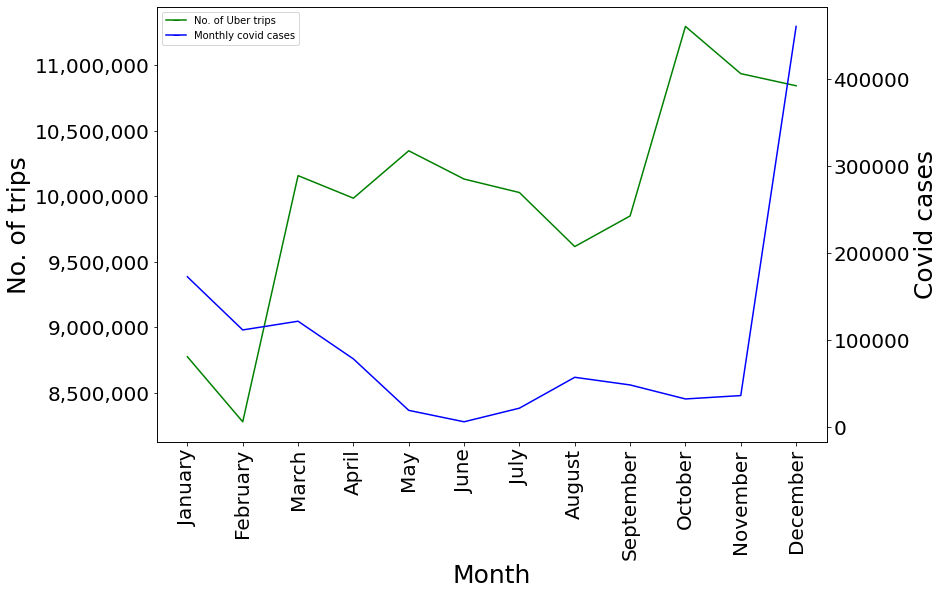

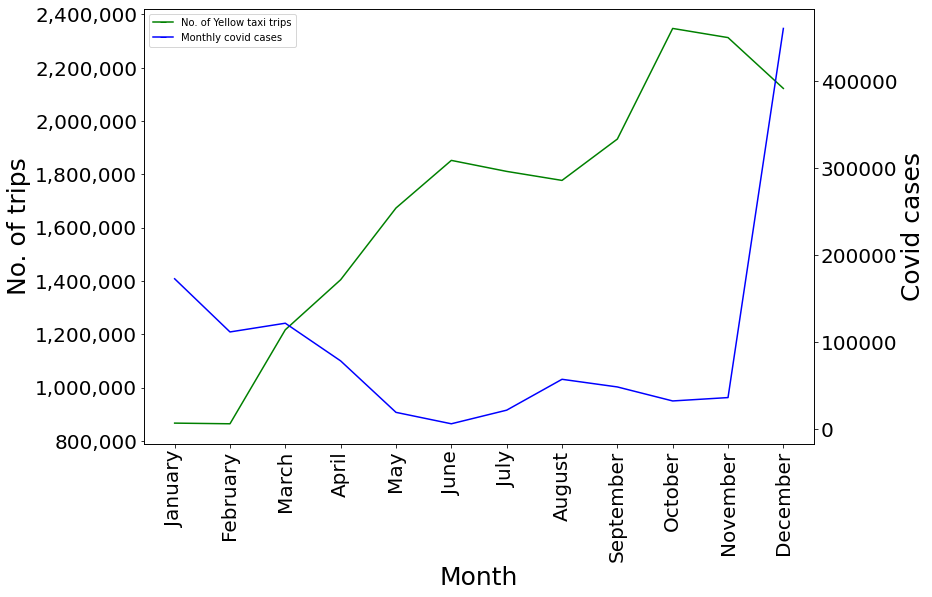

In [176]:
# Construct line plots comparing the Uber and yellow taxi trips with the 
# covid cases by month in 2021


fig1, g = plt.subplots(figsize=(12, 8))
g = sns.lineplot(x='Month', y = 'no_of_trips', data = uber_vs_covid_df, color="g")
sns.lineplot(x='Month', y = 'covid_cases' ,data=uber_vs_covid_df, color="b", ax=g.axes.twinx()).tick_params(axis='y', labelsize=20)
plt.ylabel("Covid cases", fontsize = 25)
g.legend(handles=[Line2D([], [], marker='_', color="g", label='No. of Uber trips'), Line2D([], [], marker='_', color="b", label='Monthly covid cases')])
g.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
g.tick_params(axis='y', labelsize=20)
g.set_xlabel("Month",fontsize = 25)
g.set_ylabel("No. of trips",fontsize = 25)
g.tick_params(axis='x', rotation = 90, labelsize= 20)

#plt.savefig("../plots/Uber_vs_covid.jpg",dpi=300, bbox_inches='tight')

fig1_yellow, g_yellow = plt.subplots(figsize=(12, 8))
g_yellow = sns.lineplot(x='Month', y = 'no_of_trips', data = yellow_vs_covid_df, color="g")
sns.lineplot(x='Month', y = 'covid_cases' ,data=yellow_vs_covid_df, color="b", ax=g_yellow.axes.twinx()).tick_params(axis='y', labelsize=20)
plt.ylabel("Covid cases", fontsize = 25)
g_yellow.legend(handles=[Line2D([], [], marker='_', color="g", label='No. of Yellow taxi trips'), Line2D([], [], marker='_', color="b", label='Monthly covid cases')])
g_yellow.get_yaxis().set_major_formatter(
    matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
g_yellow.tick_params(axis='y', labelsize=20)
g_yellow.tick_params(axis='x', rotation = 90, labelsize= 20)
g_yellow.set_xlabel("Month",fontsize = 25)
g_yellow.set_ylabel("No. of trips",fontsize = 25)

#plt.savefig("../plots/Yellow_vs_covid.jpg",dpi=300, bbox_inches='tight')

### Creating geospatial visualizations

In [134]:
# Code adapted from MAST30034 tutorial
# Load the geospatial data files

sf = gpd.read_file("../data/raw/taxi_zones.shp")
zones = pd.read_csv("../data/raw/nyc.csv")

# Convert the geometry shaape to to latitude and longitude
# Please attribute this if you are using it

sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

# Merge the zones with the geometrical values
gdf = gpd.GeoDataFrame(
    pd.merge(zones, sf, on='LocationID', how='inner')
)

# create a JSON 
geoJSON = gdf[['LocationID', 'geometry']].drop_duplicates('LocationID').to_json()

In [138]:
# Aggregate the taxi types by pickup locations

train_data.createOrReplaceTempView("agg")

uber_agg = spark.sql(""" 

SELECT PULocationID, COUNT(PULocationID) AS no_of_trips
FROM agg
WHERE vehicle_and_ride_type = 'Uber-Standard'
GROUP BY PULocationID

""")

yellow_agg = spark.sql(""" 

SELECT PULocationID, COUNT(PULocationID) AS no_of_trips
FROM agg
WHERE vehicle_and_ride_type = 'Yellow-Standard'
GROUP BY PULocationID

""")


In [139]:
# Convertin the location ids to int in both the datasets


uber_agg = uber_agg.withColumn(
    'PULocationID',
    F.col('PULocationID').cast('INT')
)

yellow_agg = yellow_agg.withColumn(
    'PULocationID',
    F.col('PULocationID').cast('INT')
)

# Converting to pandas dataframe

uber_agg_df = uber_agg.toPandas()
yellow_agg_df = yellow_agg.toPandas()

In [140]:
# Merging with geospatial dataframes

uber_agg_df = uber_agg_df \
    .merge(gdf[['LocationID', 'geometry']], 
    left_on='PULocationID', right_on='LocationID') \
    .drop('LocationID', axis=1)
    

yellow_agg_df = yellow_agg_df \
    .merge(gdf[['LocationID', 'geometry']], 
    left_on='PULocationID', right_on='LocationID') \
    .drop('LocationID', axis=1)

In [141]:
# Creating a map of no. of Uber trips in each location id

uber_map = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=uber_agg_df, # data source
    columns=['PULocationID','no_of_trips'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='No. of Uber trips per location'
)

c.add_to(uber_map)

uber_map

uber_map.save("../plots/Uber_trips.html")

In [142]:
# Creating a map of no. of Yellow trips in each location id

yellow_map = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON, # geoJSON 
    name='choropleth', # name of plot
    data=yellow_agg_df, # data source
    columns=['PULocationID','no_of_trips'], # the columns required
    key_on='properties.LocationID', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='No. of Yellow taxi trips per location'
)

c.add_to(yellow_map)

yellow_map

yellow_map.save("../plots/Yellow_taxi_trips.html")

### Geospatial visualization of Covid-19 in each Borough

In [144]:
# Load the covid dataset

covid_county = spark.read.parquet("../data/curated/covid_curated_train.parquet/")

In [ ]:
# Aggregate the data by borough

covid_county.createOrReplaceTempView("borough")

unique_borough = spark.sql(""" 

SELECT 
    Borough_dup, SUM(covid_cases) AS total_cases
FROM 
    borough
GROUP BY 
    Borough_dup
""")

In [147]:
# Load the geospatial data file for boroughs

borough_boundary = gpd.read_file("../data/raw/geo_export_ae876e5e-63d8-401f-97b1-1e5b83bb4e31.shp")

In [149]:
# Renaming the column

borough_boundary.rename(columns = {'boro_name':'Borough'}, inplace = True)

In [150]:
# Converting to geometic values

borough_boundary['geometry'] = borough_boundary['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

# Making a geopandas dataframe

gdf_new = gpd.GeoDataFrame(borough_boundary)

# create a JSON 

geoJSON_new = gdf_new[['Borough', 'geometry']].to_json()

# Convert to a pandas dataframe

unique_borough_df = unique_borough.toPandas()

In [154]:
# Attach the borough boundaries to the aggregated dataset

unique_borough_df = unique_borough_df \
    .merge(gdf_new[['Borough', 'geometry']], 
    left_on='Borough_dup', right_on='Borough') \
    .drop('Borough', axis=1)

In [156]:
# Create a map of covid case number in each borough

covid_map = folium.Map(location=[40.73, -73.74], tiles="Stamen Terrain", zoom_start=10)

# refer to the folium documentations on more information on how to plot aggregated data.
c = folium.Choropleth(
    geo_data=geoJSON_new, # geoJSON 
    name='choropleth', # name of plot
    data=unique_borough_df, # data source
    columns=['Borough_dup','total_cases'], # the columns required
    key_on='properties.Borough', # this is from the geoJSON's properties
    fill_color='YlOrRd', # color scheme
    nan_fill_color='black',
    legend_name='No. of Covid cases per borough'
)

c.add_to(covid_map)

covid_map

covid_map.save("../plots/Covid_cases.html")

In [ ]:
# Converting the location ids back to string

for field in ('PU', 'DO'):
    field = f'{field}LocationID'
    train_data = train_data.withColumn(
        field,
        F.col(field).cast('STRING')
    )
    
train_data.printSchema()

### Aggregating final train dataset

In [ ]:
# Aggregating the covid train data first by borough and then by month

covid_county.createOrReplaceTempView("temp")

covid_agg_sdf = spark.sql(""" 

SELECT 
    Borough_dup, Month_dup, SUM(covid_cases) AS covid_cases, 
    ROUND(AVG(positivity_rate),2) AS avg_positivity_rate, 
    CONCAT(Borough_dup, Month_dup) AS key_col
FROM 
    temp
GROUP BY 
    Borough_dup, Month_dup
""")

In [ ]:
# aggregate the train and test data by Borough, PULocationID, DOLocationID, 
# vehicle_and_ride_type, Month, Day

train_data.createOrReplaceTempView("temp")

train_agg = spark.sql(""" 

SELECT 
    Borough, Month, Day, PULocationID, DOLocationID, 
    COUNT(PULocationID) AS no_of_trips, CONCAT(Borough, Month) AS key_col, 
    vehicle_and_ride_type AS taxi_type
FROM 
    temp
GROUP BY 
    Borough, PULocationID, DOLocationID, vehicle_and_ride_type, Month, Day
ORDER BY 
    no_of_trips DESC
""")


In [ ]:
# Merging the covid train and final train dataset to get the daily case numbers 
# in each borough

agg_train_sdf= train_agg \
    .join(covid_agg_sdf, train_agg.key_col== covid_agg_sdf.key_col, "inner")\
    .drop("Borough_dup", "Month_dup", "key_col")

In [ ]:
# Ordering the aggregated train dataset

agg_train_sdf.createOrReplaceTempView("temp")

agg_train_sdf = spark.sql(""" 

SELECT 
    Borough, PULocationID, DOLocationID, taxi_type, Month, Day, 
    covid_cases, avg_positivity_rate, no_of_trips
FROM 
    temp
""")

# Converting the dataframe to pandas

agg_train_df = agg_train_sdf.toPandas()

In [165]:
# Saving the aggregated final train data in a parquet as well as csv format

agg_train_sdf.write.parquet("../data/curated/agg_train.parquet")
agg_train_df.to_csv("../data/curated/agg_train.csv")

### Aggregating final test dataset

In [166]:
# Loading the covid test data

covid_county_test = spark.read.parquet("../data/curated/covid_curated_test.parquet/")

In [ ]:
# Aggregating the covid data

covid_county_test.createOrReplaceTempView("temp")

covid_test_agg = spark.sql(""" 

SELECT 
    Borough_dup, Month_dup, SUM(covid_cases) AS covid_cases, 
    ROUND(AVG(positivity_rate),2) AS avg_positivity_rate, 
    CONCAT(Borough_dup, Month_dup) AS key_col
FROM 
    temp
GROUP BY 
    Borough_dup, Month_dup
""")

In [168]:
# Loading the final test data

test_data = spark.read.parquet("../data/curated/final_test_dataset.parquet/")

In [ ]:
# Aggregating the final test data by Borough, PULocationID, DOLocationID, 
# vehicle_and_ride_type, Month, Day

test_data.createOrReplaceTempView("temp")

agg_test_sdf = spark.sql(""" 

SELECT 
    Borough, Month, Day, PULocationID, DOLocationID, 
    COUNT(PULocationID) AS no_of_trips, CONCAT(Borough, Month) AS key_col, 
    vehicle_and_ride_type AS taxi_type
FROM 
    temp
GROUP BY 
    Borough, PULocationID, DOLocationID, vehicle_and_ride_type, Month, Day
ORDER BY 
    no_of_trips DESC
""")

In [ ]:
# Joinign the aggregated covid and test data

agg_test = agg_test_sdf \
    .join(covid_test_agg, agg_test_sdf.key_col== covid_test_agg.key_col, "inner")\
    .drop("Borough_dup", "Month_dup", "key_col")

# Converting the dataframe to pandas

agg_test_df = agg_test_sdf.toPandas()

In [172]:
# Saving the aggregated test data as parquet and csv

agg_test.write.parquet("../data/curated/agg_test.parquet")
agg_test_df.to_csv("../data/curated/agg_test.csv")